This Notebook is about an overview of **Mediapipe**, we discuss: 
1. How to perform it on images and videos.
2. The interest of the landmarks.
2. The appropriate settings for our use case.
3. In which cases it's suitable to use Mediapipe and in which cases it's not.

# Table of contents
1. [About MediaPipe Pose](#1)
2. [Installation and initialization ](#2)
3. [Pose estimation from images](#3)
4. [About the landmarks](#4)
5. [model_complexity=1 vs model_complexity=2](#5)
6. [Limits of MediaPipe](#6)
    1. [Head not shown in the image](#61)
    2. [Person with back turned](#62)
    3. [Far from the camera](#63)
    4. [Multi person detection](#64)
7. [MediaPipe for videos](#7)
8. [Conlusion](#8)

# About MediaPipe Pose <a class="anchor" id="1"></a>

MediaPipe Pose is a ML solution for body pose estimation/tracking, inferring 33 3D landmarks (see image below) on the whole body from RGB image/video. The solution utilizes a two-step detector-tracker ML pipeline. Using a detector, the pipeline first locates the person within the frame (region of interest - ROI). The tracker subsequently predicts the pose landmarks within the ROI using the ROI-cropped frame as input. For video use cases the detector is invoked only as needed, i.e., for the very first frame and when the tracker could no longer identify body person presence in the previous frame. For other frames the pipeline simply derives the ROI from the previous frame’s pose landmarks.

NB: Optionally, MediaPipe Pose can predicts a full-body segmentation mask represented as a two-class segmentation (human or background), but this option is not the subject of this notebook. See [google.github](https://google.github.io/mediapipe/solutions/pose.html) for more for more details.

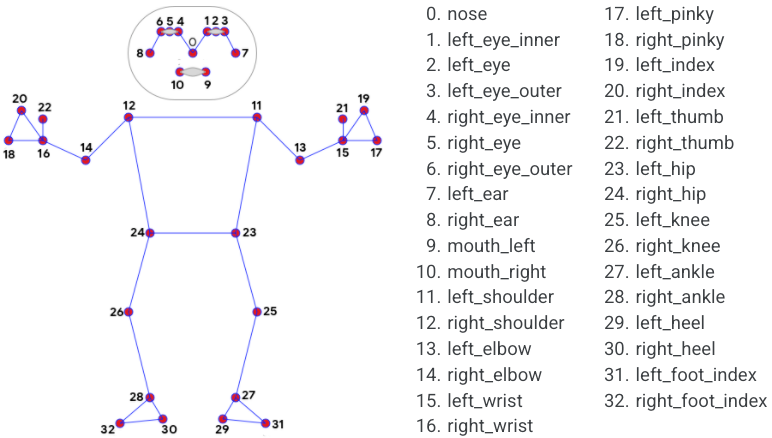

<p style="text-align: center;">Fig1. 33 pose landmarks - From "https://google.github.io/mediapipe/solutions/pose.html"</p>

I create two small datasets (images & videos) from the free stock photos "https://www.pexels.com/" for testing Mediapipe. Bellow we show some examples of pose estimation generated by running MediaPipe on videos from the dataset "videos".

NB : We are using MediaPipe as a pretrained model so the data uploaded here are just for testing.

![Alt Text](https://media1.giphy.com/media/n6m9rcfXYWZV7X8rXg/giphy.gif)
![Alt Text](https://media3.giphy.com/media/OAHtQUi0vvCKzWd3bT/giphy.gif)
![Alt Text](https://media4.giphy.com/media/4eq6p2jbrDFq6skW9j/giphy.gif)
![Alt Text](https://media1.giphy.com/media/35WCvsN32wMCSkHJAO/giphy.gif)
![Alt Text](https://media1.giphy.com/media/BvwRJtQ8yDkM7SmVjf/giphy.gif)

# Installation and initialization <a class="anchor" id="2"></a>

It's really simple to debut with MediaPipe comparing to other pose estimation frameworks. We just have to install the python package "mediapipe" and then import the needed functions. Once MediaPipe is available on our python environment, we initialize the pose estimation function in order to fixe desired performances. 

In [1]:
! pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.9/32.9 MB 16.1 MB/s eta 0:00:0000:0100:01


Here we are working with a pretrained model, so the only thing that we need to do is to set the appropriate parameters.

* static_image_mode: we set it to True if we have a single image or unrelated images as input. If the input is a video we set it to False so that the model will use the previous frames to detect the person rather than recalling the detector, this way computation and latency are optimised. True is the default value.
* min_detection_confidence: it indicates  the minimum confidence value ([0.0, 1.0]) so that the detection is considered as valid. The default value is 0.5.
* min_tracking_confidence: if static_image_mode is set to False, in which case we have a video as input, it indicates the minimum confidence value ([0.0, 1.0]) for the pose landmarks model to be considered tracked successfully without recalling the detector. If this minimum confidence value is not richead, the detector will be invoked automatically.
* model_complexity: It can be 0, 1, or 2. 2 is for a higher performance but this may potentially increase the latency. 1 is the default value which, in general case, gives good results.

Other parameters are detailed [here](https://google.github.io/mediapipe/solutions/holistic.html#model_complexity).

In [2]:
import cv2 #to read and process images
import matplotlib.pyplot as plt #to show resultant images 
import mediapipe as mp

# Initializing mediapipe pose class.
mp_pose = mp.solutions.pose
# Setting up the Pose model for images.
pose_img = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=1)
# Setting up the Pose model for videos.
pose_video = mp_pose.Pose(static_image_mode=False, min_detection_confidence=0.5, 
                          min_tracking_confidence=0.5, model_complexity=1)

# Initializing mediapipe drawing class to draw landmarks on specified image.
mp_drawing = mp.solutions.drawing_utils

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


# Pose estimation from images <a class="anchor" id="3"></a>

We create the function "estimPose_img()" to estimate the pose landmarks on an image given as input. Before performing the pose estimation, some image preprocessing may be needed, like, converting the image to the RGB form. We can choose to display the resulting image with the estimate landmarks drawn or just return the output image and the coordinates of the landmarks.

Fortunately we have drawing tools included with MediaPipe, although we may need to do some customization to improve the visual results.

In [4]:
def estimPose_img(input_file, pose=pose_img, landmarks_c=(234,63,247), connection_c=(117,249,77), 
                   thickness=20, circle_r=10, display=True):
    
    # Read the input image
    if isinstance(input_file, str) :
        input_img = cv2.imread(input_file)
    else :
        input_img = input_file
    
    # Create a copy of the input image
    output_img = input_img.copy()
    
    # Convert the image from BGR into RGB format.
    RGB_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
    
    # Perform the Pose Detection.
    results = pose.process(RGB_img)
    
    # Retrieve the height and width of the input image.
    height, width, _ = input_img.shape
    
    # Initialize a list to store the detected landmarks.
    landmarks = []
    
    # Check if any landmarks are detected.
    if results.pose_landmarks:
    
        # Draw Pose landmarks on the output image.
        mp_drawing.draw_landmarks(output_img, results.pose_landmarks, mp_pose.POSE_CONNECTIONS, 
                                  mp_drawing.DrawingSpec(landmarks_c, thickness, circle_r),
                                  mp_drawing.DrawingSpec(connection_c, thickness, circle_r))
        
        # Iterate over the detected landmarks.
        for landmark in results.pose_landmarks.landmark:
            landmarks.append((int(landmark.x * width), int(landmark.y * height),
                                  (landmark.z * width)))
    
    # Check if we want to display.
    if display:
        # Display the original input image and the resulting image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(input_img[:,:,::-1]);plt.title("Original image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_img[:,:,::-1]);plt.title("Output image");plt.axis('off');
        
        # Plot the Pose landmarks in 3D.
        mp_drawing.plot_landmarks(results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
        
    # Just get output_img and landmarks
    else:
        # Return the output image and the found landmarks.
        return output_img, landmarks

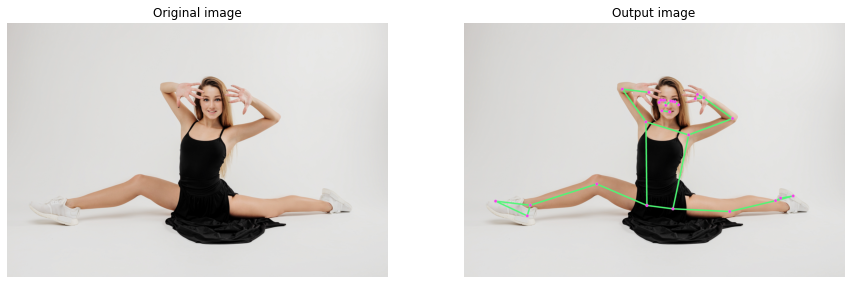

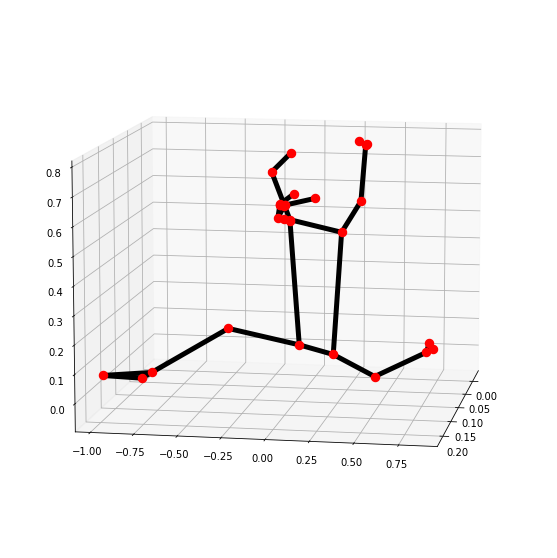

In [5]:
estimPose_img('../input/images/dance_one_pers_1.jpg')

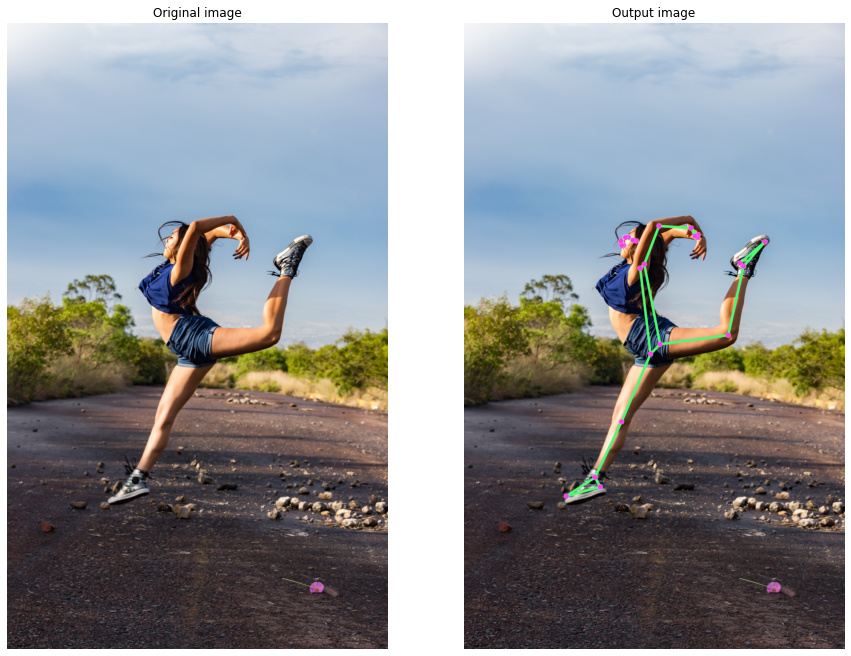

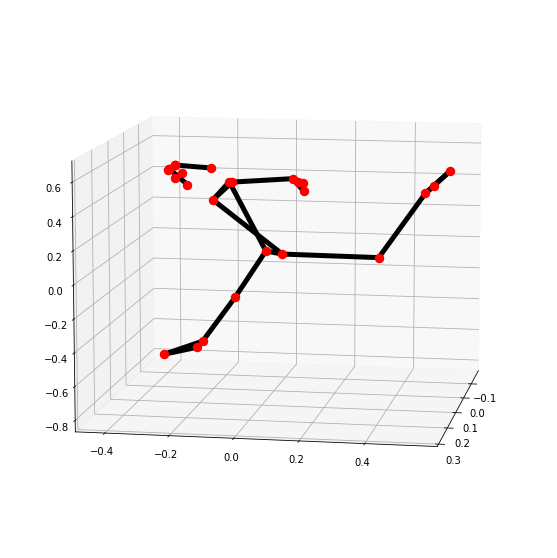

In [6]:
estimPose_img('../input/images/dance_one_pers_2.jpg')

# About the landmarks <a class="anchor" id="4"></a>

The geometric properties of the obtained points (landmarks) can be used to create applications related to the human body. The majority of applications based on MediaPipe are in fitness and dance. You can see in this [Youtube video](https://www.youtube.com/watch?v=06TE_U21FK4&t=2776s&ab_channel=NicholasRenotte) and [this one](https://www.youtube.com/watch?v=aySurynUNAw&list=PLwu133Q2Ypddd_6o6MGg8-DULfIu_ESlr&index=1&t=1720s&ab_channel=BleedAI) an example of Gym Tracker Project implementation well detailed step by step.  

Let's see a simple example of how we can use the landmarks to check if a specific pose is verified or not. First we have to extract the coordinates of the needed key points, good news, we can easily get them by calling our function created above "estimPose_img()" and look at the fig1 (33 pose landmarks) to see wich points do we need for our specific project. Then we have to translate the desired pose into a mathematical formula. Here is the example: Let's say that we want to do the pose seen in the image below (sport_one_pers_2.jpg), by carefully observing the pose and referring to fig1, we see that the following points must be "aligned". 

* **LEFT_ELBOW** (13), **LEFT_SHOULDER** (11) and **LEFT_HIP** (23)  
* **LEFT_SHOULDER** (11), **LEFT_HIP** (23) and **LEFT_KNEE** (25)  
* **RIGHT_ELBOW** (14), **RIGHT_SHOULDER** (12) and **RIGHT_HIP** (24)
* **RIGHT_SHOULDER** (12), **RIGHT_HIP** (24) and **RIGHT_KNEE** (26)
  

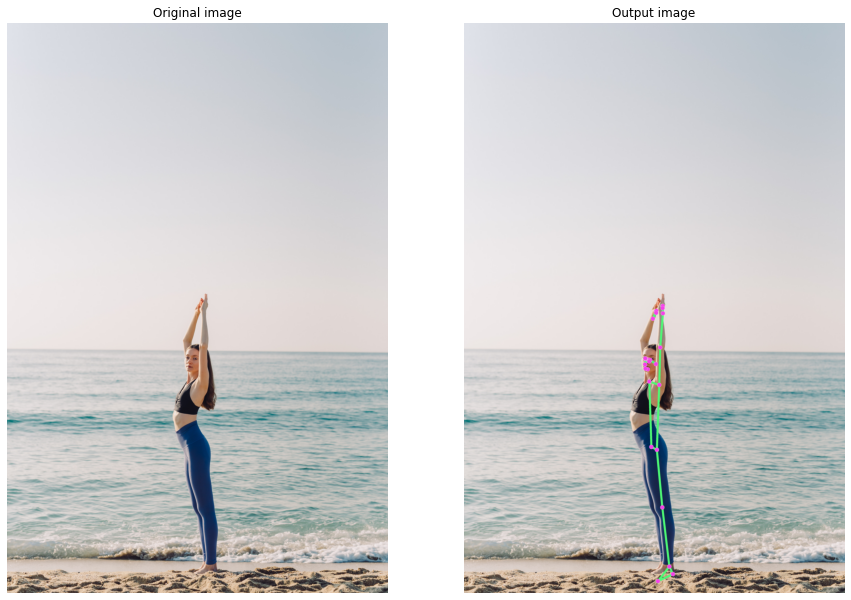

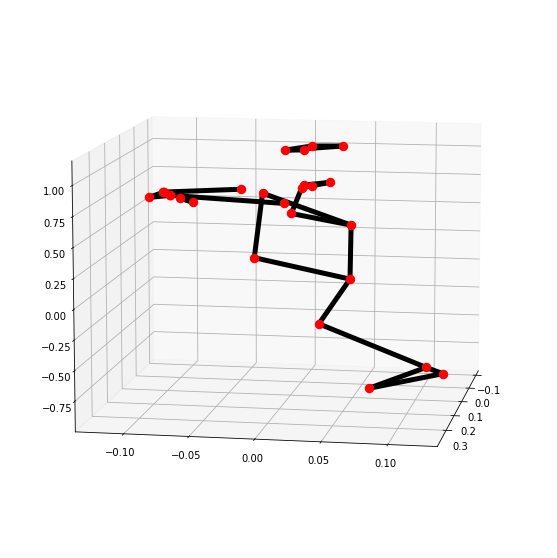

In [7]:
estimPose_img('../input/images/sport_one_pers_2.jpg')

Three points are aligned if they form an angle of 180°. So below we create a function that gives us the angle formed by three points. 

In [8]:
import math
# Calculate the angle between three points
def calcul_angle(point1, point2, point3):
    x1, y1, _ = point1
    x2, y2, _ = point2
    x3, y3, _ = point3
    angle = math.degrees(math.atan2(y3 - y2, x3 - x2) - math.atan2(y1 - y2, x1 - x2))
    return angle

In [9]:
_, landmarks = estimPose_img('../input/images/sport_one_pers_2.jpg', display=False)

print('The angle formed by', 
      mp_pose.PoseLandmark(13).name, ',',
      mp_pose.PoseLandmark(11).name, 'and', 
      mp_pose.PoseLandmark(23).name, 'is:', 
      calcul_angle(landmarks[13], landmarks[11], landmarks[23])) 

print('The angle formed by', 
      mp_pose.PoseLandmark(11).name, ',',
      mp_pose.PoseLandmark(23).name, 'and', 
      mp_pose.PoseLandmark(25).name, 'is:', 
      calcul_angle(landmarks[11], landmarks[23], landmarks[25]))
    
print('The angle formed by', 
      mp_pose.PoseLandmark(14).name, ',',
      mp_pose.PoseLandmark(12).name, 'and', 
      mp_pose.PoseLandmark(24).name, 'is:', 
      calcul_angle(landmarks[14], landmarks[12], landmarks[24]))

print('The angle formed by', 
      mp_pose.PoseLandmark(12).name, ',',
      mp_pose.PoseLandmark(24).name, 'and', 
      mp_pose.PoseLandmark(26).name, 'is:', 
      calcul_angle(landmarks[12], landmarks[24], landmarks[26]))

The angle formed by LEFT_ELBOW , LEFT_SHOULDER and LEFT_HIP is: 180.5790228980405
The angle formed by LEFT_SHOULDER , LEFT_HIP and LEFT_KNEE is: 172.49379761882753
The angle formed by RIGHT_ELBOW , RIGHT_SHOULDER and RIGHT_HIP is: 180.1081547535341
The angle formed by RIGHT_SHOULDER , RIGHT_HIP and RIGHT_KNEE is: 176.76860663756852


Let's call $a_1$ the angle formed by LEFT/RIGHT_ELBOW, LEFT/RIGHT_SHOULDER and LEFT/RIGHT_HIP, and $a_2$ the angle formed by LEFT/RIGHT_SHOULDER , LEFT/RIGHT_HIP and LEFT/RIGHT_KNEE, to check if a given pose is correct (like in the image sport_one_pers_2.jpg), we can check if the following conditions are satisfied :

$$178<a_1<182$$ $$and$$ $$171<a_2<182$$

Of course this is just a suggestion, we need an expert to fix the suitable values for a given pose. Since virtual fitness trainer is not the subject of this notebook, I'll not create a program that checks if we have a good pose or not, but the main idea on how it can be done is quite clear. 


# model_complexity=1 vs model_complexity=2 <a class="anchor" id="5"></a>

Let's test if we can improve the pose landmarks estimation if we are using the model_complexity=2. Here we create a simple function to compare two output images of the same input image after performing the pose estimation with model_complexity=1 and model_complexity=2.

In [10]:
pose1 = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=1)
pose2 = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=2)

In [11]:
def compl1_vs_compl2(input_file, pose1=pose1, pose2=pose2):
    output_img1, _ = estimPose_img(input_file, pose=pose1, display=False)
    output_img2, _ = estimPose_img(input_file, pose=pose2, display=False)

    plt.figure(figsize=[15,15])
    plt.subplot(121);plt.imshow(output_img1[:,:,::-1]);plt.title("Output image model_complexity=1");plt.axis('off');
    plt.subplot(122);plt.imshow(output_img2[:,:,::-1]);plt.title("Output image model_complexity=2");plt.axis('off');

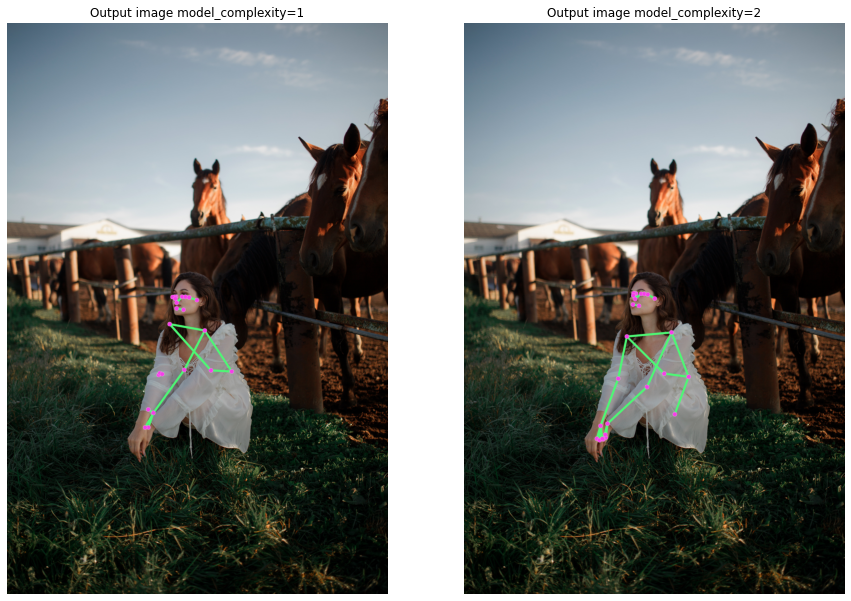

In [12]:
compl1_vs_compl2('../input/images/one_pers_1.jpg')

From the outputs above we can see that the skeleton of the person is well detected with the heavy model (complexity=2). But this doesn't mean that it's always the case. Bellow we show some exemples where the full model (complexity=1) performes well than the heavy one. 

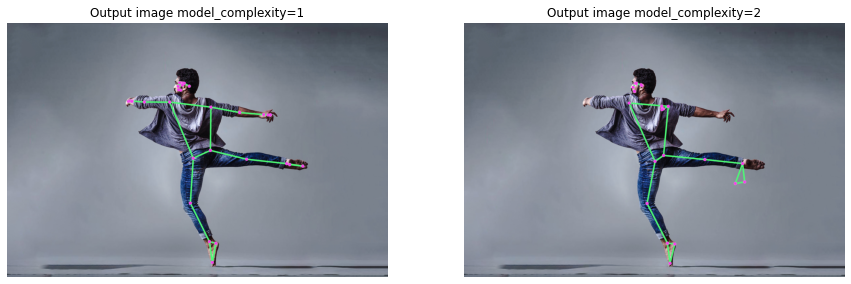

In [13]:
compl1_vs_compl2('../input/images/dance_one_pers_11.jpg')

See here how the two arms are not detected with the heavy model ! 

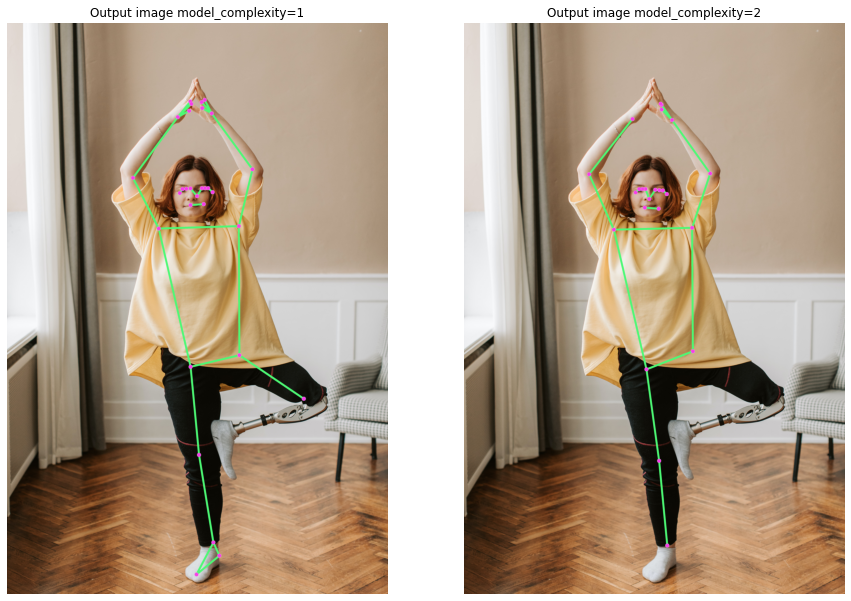

In [14]:
compl1_vs_compl2('../input/images/sport_one_pers_1.jpg')

And see here how the full model detects  'the half' of the right leg while the heavy model does not. Even the left foot and the left hand are not detected by the heavy model !

Bellow we show two examples of images where the full model (complexity=1) doesn't detect any person key point unlike the heavy model who does.  

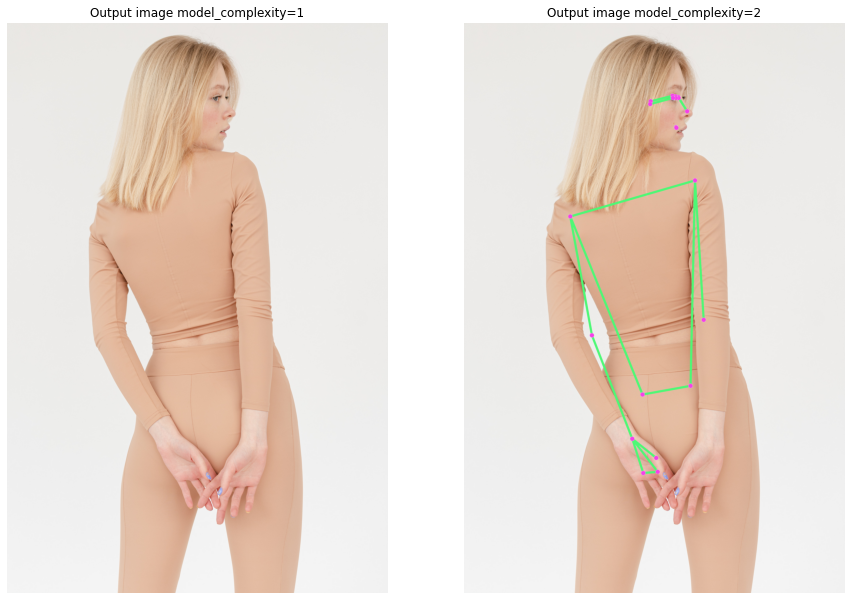

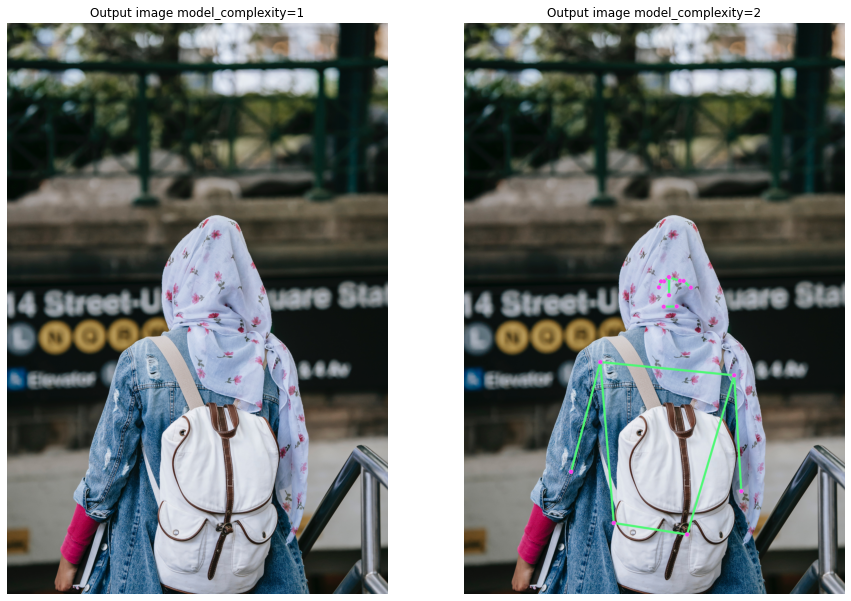

In [15]:
compl1_vs_compl2('../input/images/pers_low_contr_8.jpg')
compl1_vs_compl2('../input/images/cove_head_back_3.jpg')

And surprisingly we can have the opposite situation, below we show an example where the heavy model doesn't have any idea about the person key points but the full model recognizes a good part of them.

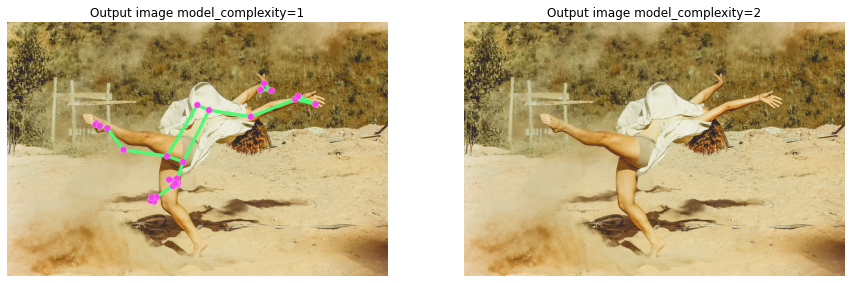

In [16]:
compl1_vs_compl2('../input/images/dance_one_pers_3.jpg')

# Limits of MediaPipe <a class="anchor" id="6"></a>

Here are the three major limitations of MediaPipe unless you retrain/customize it yourself. 

1. It can not detect a person if the head is not shown in the image.
2. The person detector is trained for closeup cases (less than 4 meters).
3. Pose landmarks model predicts the key points of one single person in the image, it can't be used for multi person pose estimation. 

## Head not shown in the image <a class="anchor" id="61"></a>

The person detection model in mediapipe is based on the face detection and the prediction of two virtual keypoints that describe the human body, see fig 2. When it can't "extract" the humain face, there is explicitly no chance for it to detect the person within the image. 

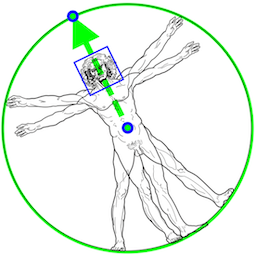

<p style="text-align: center;">Fig 2. Vitruvian man aligned via two virtual keypoints - From "https://google.github.io/mediapipe/solutions/pose.html"</p>

Here are some examples where the head is not shown totally or partially, so MediaPipe could not detect the person in the given images. 

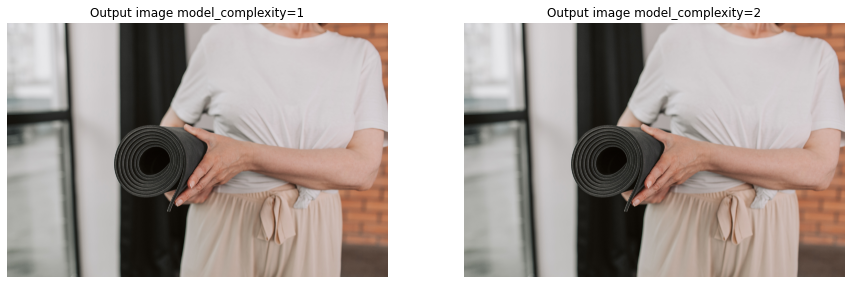

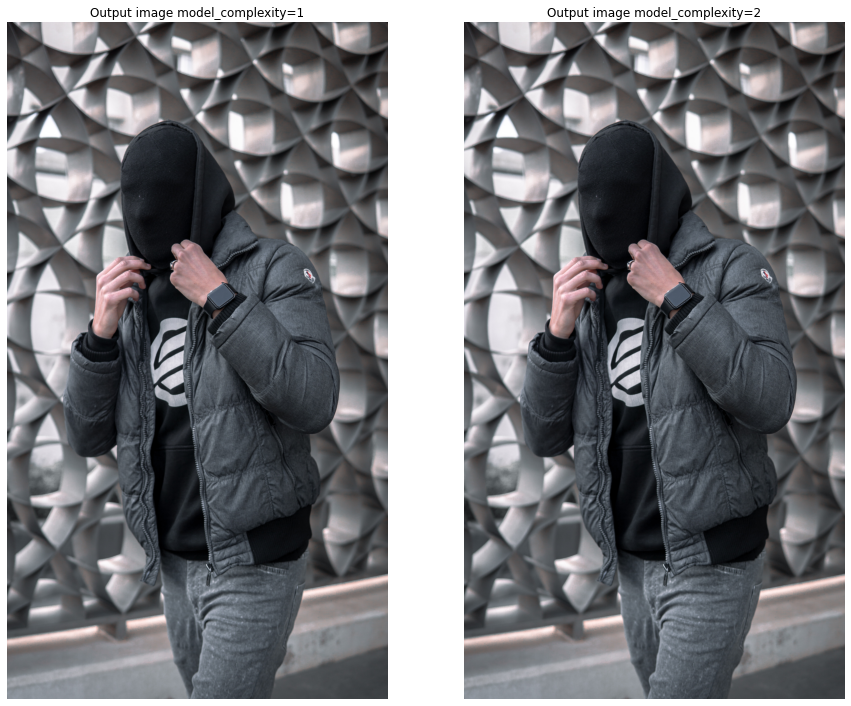

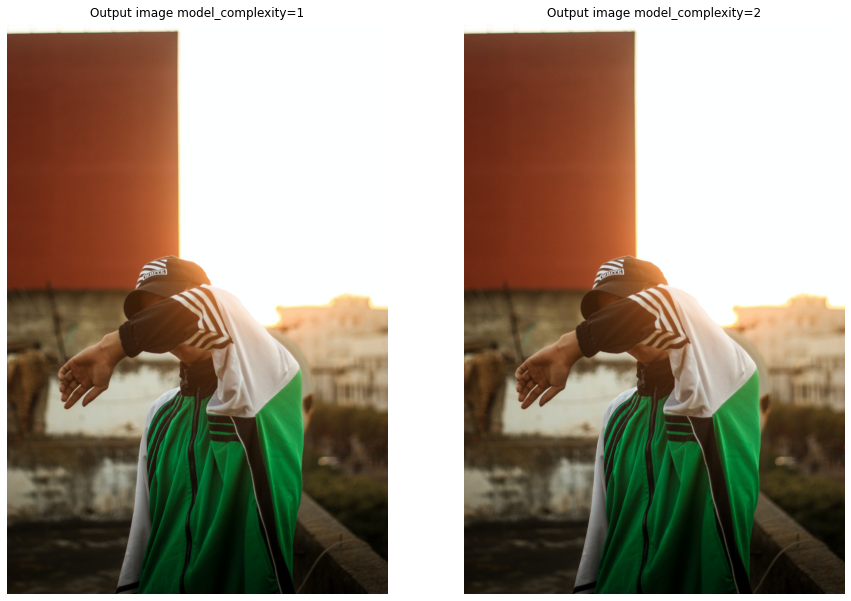

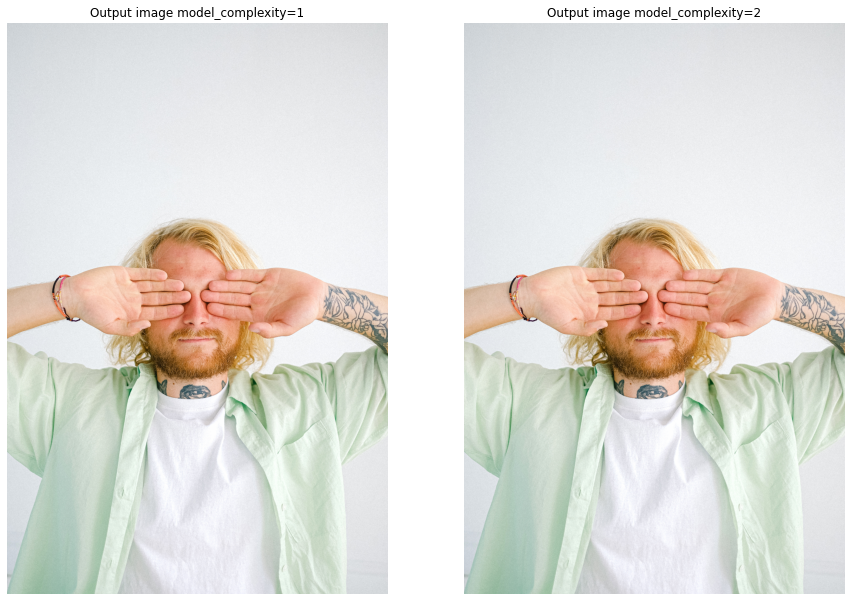

In [17]:
compl1_vs_compl2('../input/images/half_pers_3.jpg')
compl1_vs_compl2('../input/images/cov_head_7.jpg')
compl1_vs_compl2('../input/images/pers_hide_eyes.jpg')
compl1_vs_compl2('../input/images/pers_low_contr_11.jpg')

## Person with back turned <a class="anchor" id="62"></a>

As we said before, there is two steps for the pose estmation, the first one aims to detect a person within the image, it performs the detector model. The second step performs the pose landmark model. The detector model is mainly based on the detection of the human face, so what happens if the person turns his back to the camera? The model may not recognize the person ! Sometimes, and especially when we have a low contrast between the head and the remaining body, MediaPipe fails to detect the person.  
Below we show some examples where neither the model with complexity 1 nor the model with complexity 2 could detect the person in the image.  

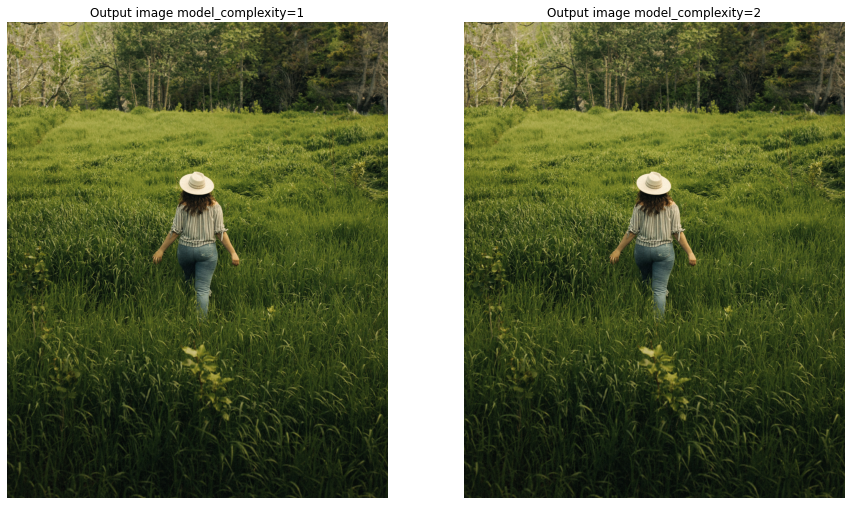

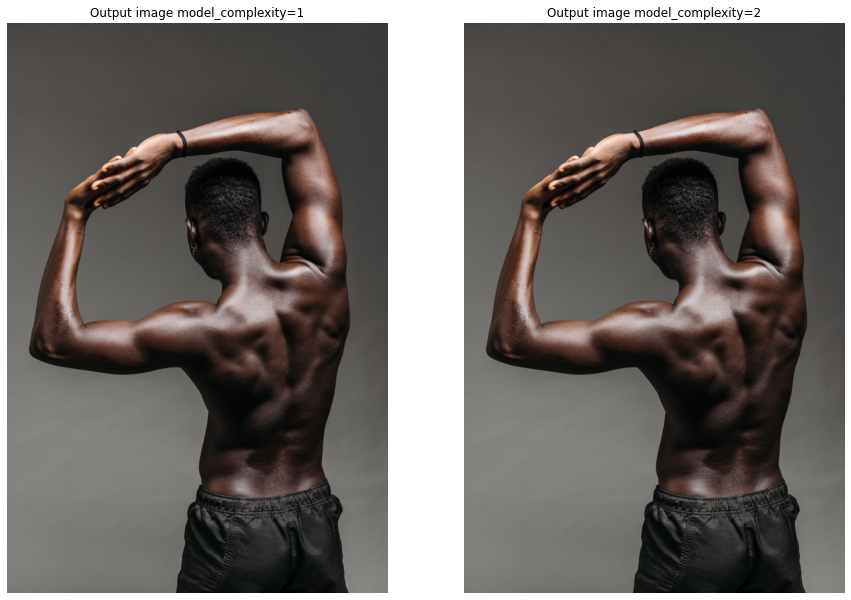

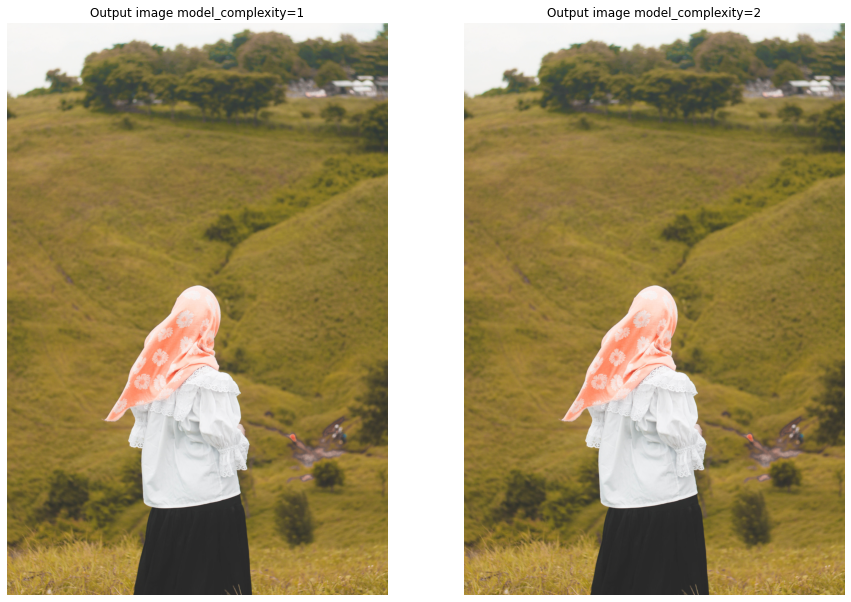

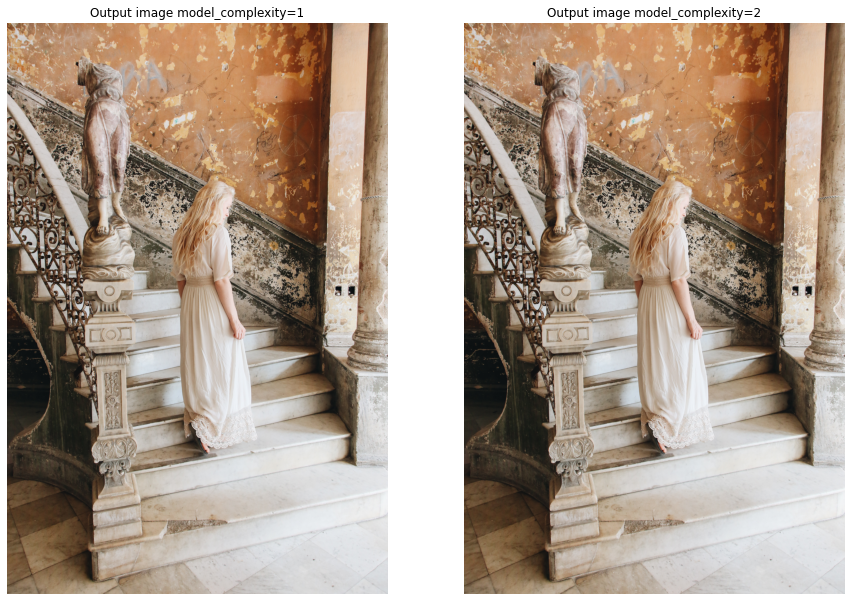

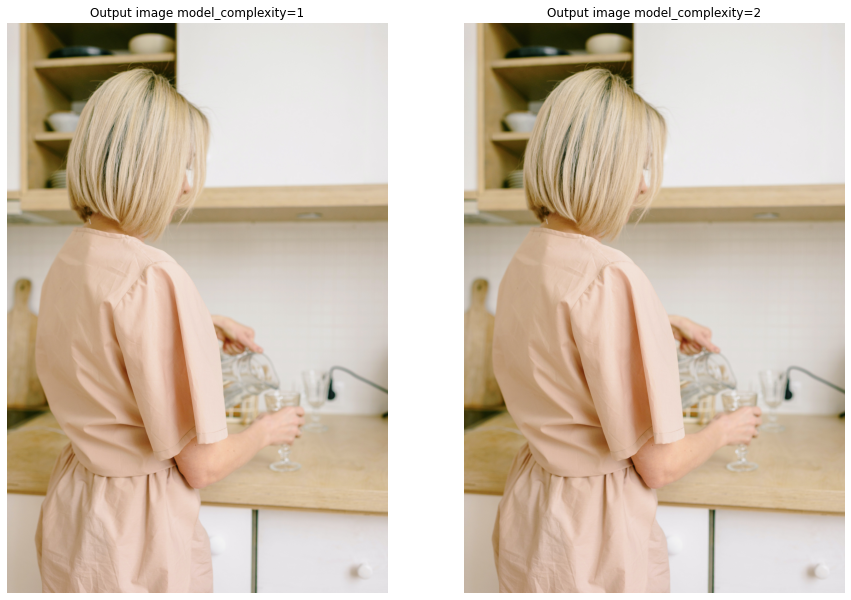

In [18]:
compl1_vs_compl2('../input/images/one_pers_10.jpg')
compl1_vs_compl2('../input/images/one_pers_back_8.jpg')
compl1_vs_compl2('../input/images/cove_head_back_1.jpg')
compl1_vs_compl2('../input/images/pers_low_contr_2.jpg')
compl1_vs_compl2('../input/images/pers_low_contr_4.jpg')

Of course in many other cases, mediapipe can recognize a person from his back, here are some successful predictions.

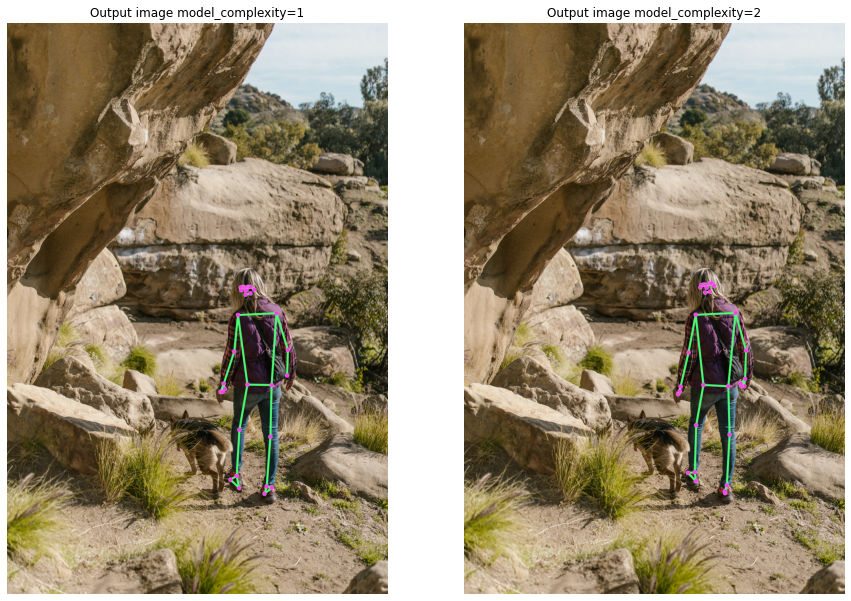

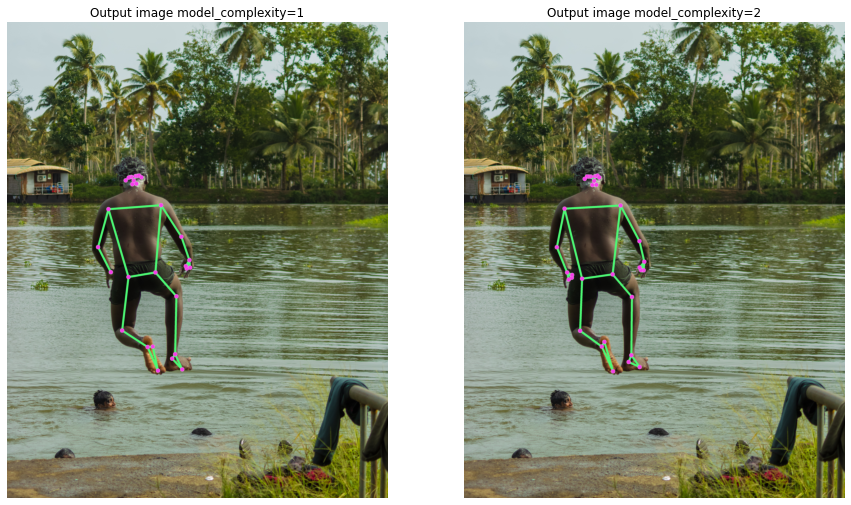

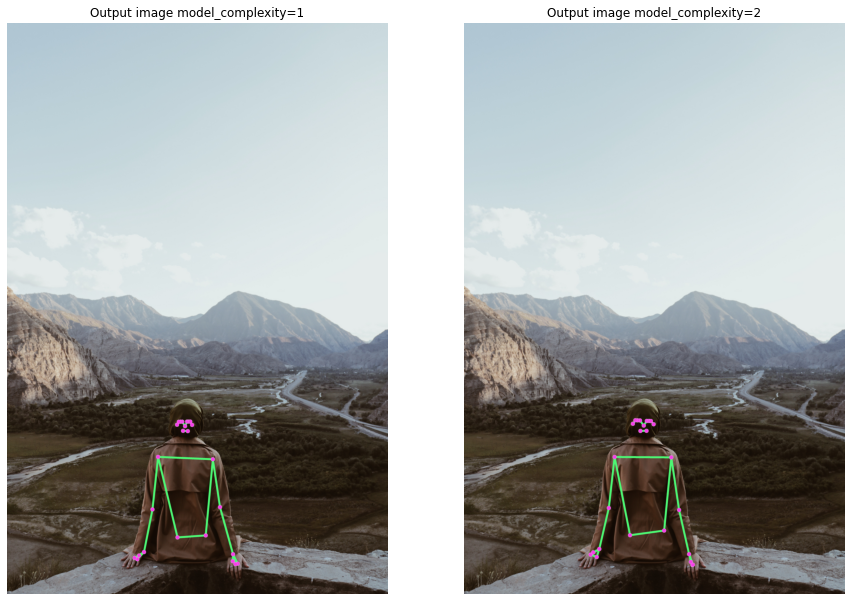

In [19]:
compl1_vs_compl2('../input/images/one_pers_back_4.jpg')
compl1_vs_compl2('../input/images/one_pers_back_5.jpg')
compl1_vs_compl2('../input/images/cove_head_back_5.jpg')

## Far from the camera <a class="anchor" id="63"></a>

MediaPipe can't recognize the person if he is more than 4 meters far from the camera. Here is an example of detection failure.

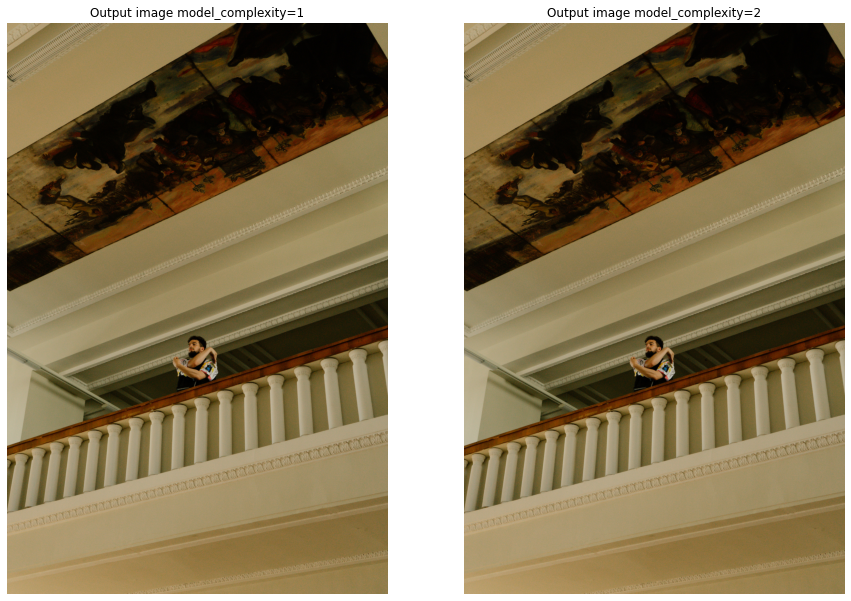

In [20]:
compl1_vs_compl2('../input/images/pers_far_6.jpg')

## Multi person detection <a class="anchor" id="64"></a>

The detector in MediaPipe can detect every person in the image, but the landmarks model can be performed for just one single person. 

![Alt Text](https://media2.giphy.com/media/vKewFc1C3fQWUu5jQn/giphy.gif)
![Alt Text](https://media3.giphy.com/media/1kgmZZPT3WVwkTnfPf/giphy.gif)

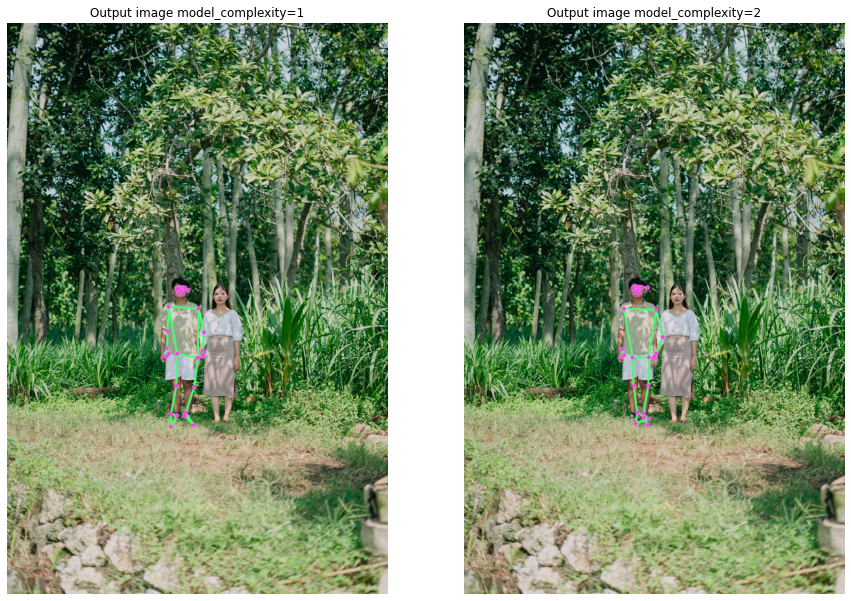

In [21]:
compl1_vs_compl2('../input/images/multi_pers_1.jpg')

# MediaPipe for videos <a class="anchor" id="7"></a>

Since we can now perform the human pose estimation for images, let's see how it can be used in video cases. 

To capture a video and perform pose estimation frame by frame, we are using ***OpenCV***. But to show the resulting video, we can't easily use ***OpenCV*** in kaggle notebook (we have the same problem in colab notebook). On the other hand, we can use ***matplotlib*** to show some resulting frames. We can also use ***imageio*** library to create a GIF file from this frames.



In [22]:
def estimPose_video(input_file, pose_video=pose_video, landmarks_c=(234,63,247), connection_c=(117,249,77), 
                 thickness=5, circle_r=5, display=True, nrows_frames=4, ncols_frames=3):
    
    # Initialize the VideoCapture object to read from a video stored in the disk.
    video = cv2.VideoCapture(input_file)
    
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    frames = []
    
    for i in range(total_frames):
        # Read a frame.
        ok, frame = video.read()
    
        # Check if frame is not read properly.
        if not ok:
            # Break the loop.
            break
        
        # Get the width and height of the frame
        frame_height, frame_width, _ =  frame.shape
        # Resize the frame while keeping the aspect ratio.
        frame = cv2.resize(frame, (int(frame_width * (640 / frame_height)), 640))
        frame, _ = estimPose_img(frame, pose_video, landmarks_c, connection_c, thickness, 
                              circle_r, display=False)
    
        frames.append(frame)
    
    if display :
        fig, axarr = plt.subplots(nrows_frames,ncols_frames,figsize=[15, 15])
        k=0
        for i in range(nrows_frames):
            for j in range(ncols_frames):
                axarr[i,j].imshow(frames[k][:,:,::-1]);axarr[i,j].axis('off')
                k+=1
    else:
        return frames

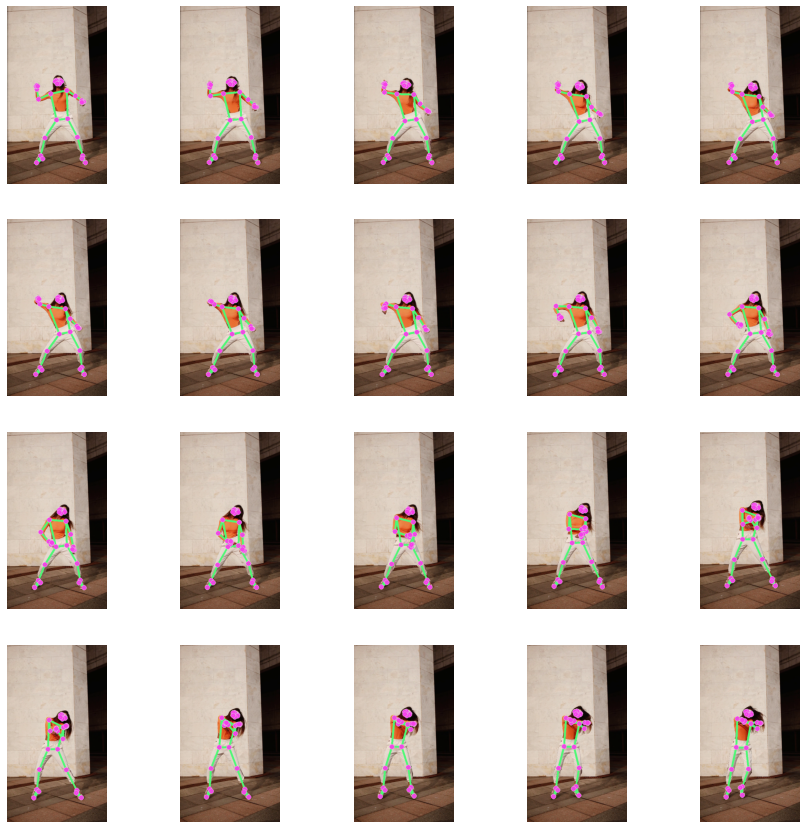

In [23]:
estimPose_video("../input/videos/one_pers_dance_1.mp4", nrows_frames=4, ncols_frames=5)

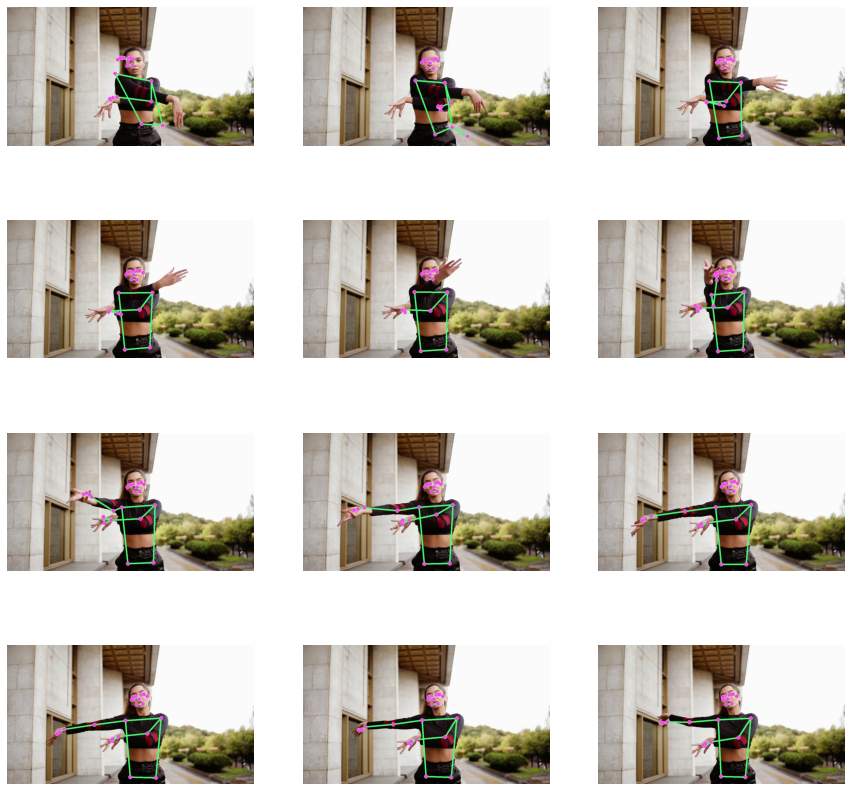

In [24]:
estimPose_video("../input/videos/one_pers_dance_4.mp4")

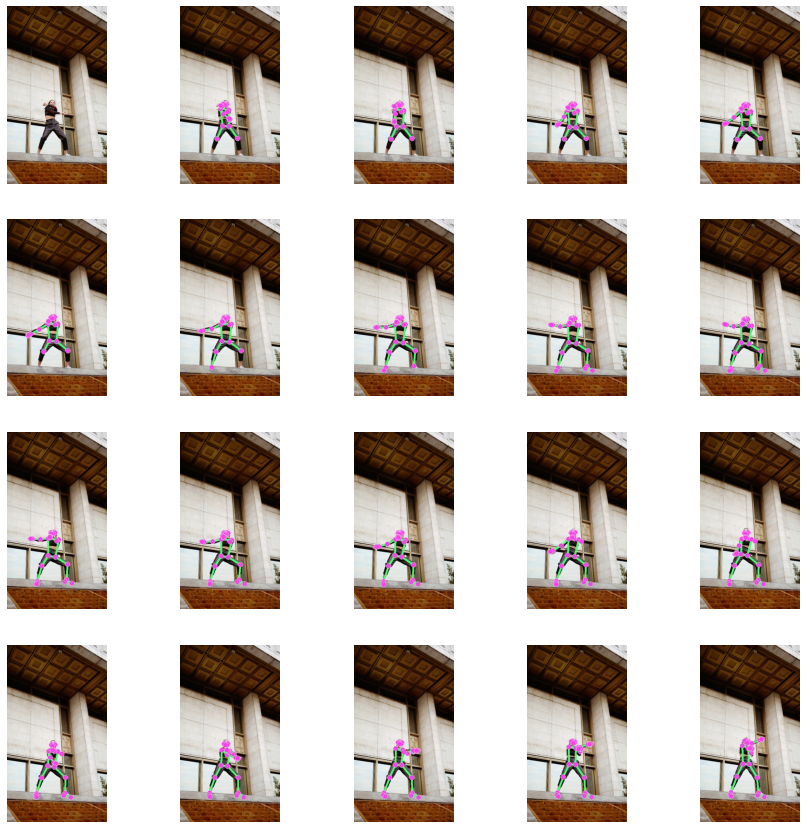

In [25]:
estimPose_video("../input/videos/one_pers_dance_5.mp4", nrows_frames=4, ncols_frames=5)

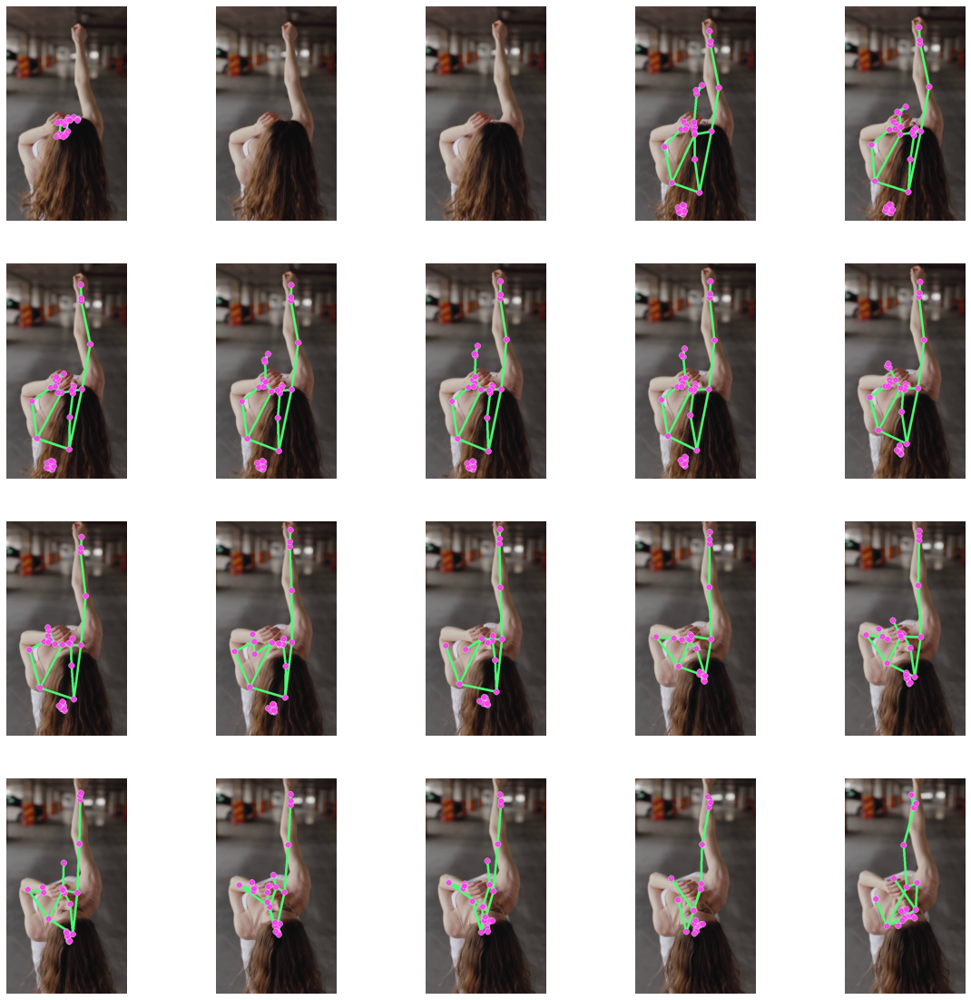

In [12]:
estimPose_video("../input/videos/one_pers_dance_6.mp4", nrows_frames=4, ncols_frames=5)

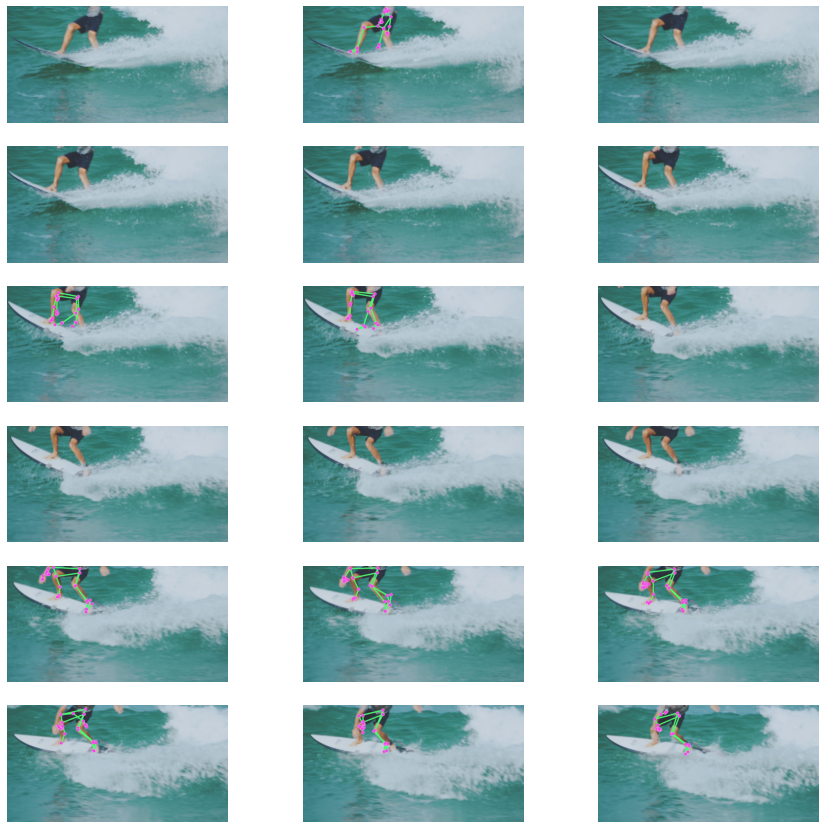

In [28]:
estimPose_video("../input/videos/one_pers_surf_1.mp4", nrows_frames=6)

In [ ]:
# Get frames after pose estimation and then create a GIF file with those frames.

# Get resulting frames after pose estimation.
frames = estimPose_video("../input/videos/one_pers_dance_4.mp4", display=False)
# Create a GIF file from this frames. 
imageio.mimsave('one_pers_dance_4.gif', frames, fps=30)

All videos used here are in the dataset "Videos" associated with this notebook. Some of the created GIFs are shown at the top of this notebook. You can also try ***cv2.VideoWriter*** to create a video from frames, but in my case I think a GIF file is quite sufficient to show the result. 

# Conlusion <a class="anchor" id="8"></a>

This Notebook was about an overview of **Mediapipe** : 
1. How to perform it on images and videos.
2. The appropriate settings for our use case.
3. In which cases it's suitable to use it and in which cases it's not.

One can find in the internet several projects, especially related to virtual fitness trainer, based on MediaPipe. The main idea behind is to analyse the geometry of some key points that describes the wanted pose. In fitness field, Mediapipe is very useful, we just need to specify to the user that he must keep a distance of less than 4 meters from the camera and have a non confusing backgroud.  The best part of MediaPipe is the fact that it's light to be used with devices like smart phones compared to other frameworks, check the [link](https://google.github.io/mediapipe/solutions/pose) for more details. 